In [0]:
import numpy as np
from natsort import natsorted, ns
from  scipy.ndimage.filters import convolve
import matplotlib.pyplot as plt
import os
import imageio
import glob

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
def opticalFlowDerevatives(img_1, img_2):
  mask_x = np.array([[-1, 1], [-1, 1]]) * 0.25
  mask_y = np.array([[-1, -1], [1, 1]]) * 0.25
  mask_t = -np.ones((2, 2)) * 0.25
    
  fx = convolve(img_1, mask_x) + convolve(img_2, mask_x)
  fy = convolve(img_1, mask_y) + convolve(img_2, mask_y)
  ft = convolve(img_1, mask_t) + convolve(img_2, -mask_t)

  return fx, fy, ft

def HornSchunck(img_1, img_2, smooth_param, num_iterations, plotD = False):
  mask_average = np.array([[1/12, 1/6, 1/12], [1/6, 0, 1/6], [1/12, 1/6, 1/12]], float)
  
  img_1, img_2 = img_1.astype(np.float32), img_2.astype(np.float32)
  
  U, V = np.zeros([img_1.shape[0], img_1.shape[1]]), np.zeros([img_1.shape[0], img_1.shape[1]]) # We may initilize U and V differently, hence creating initiail_U and initial_V
    
  fx, fy, ft = opticalFlowDerevatives(img_1, img_2)
  
  if plotD:
    plotDerevatives(fx, fy, ft) 
  
  for iteration in range(num_iterations):
    average_U, average_V = convolve(U, mask_average), convolve(V, mask_average)
    P = (fx * average_U) + (fy * average_V) + ft
    D = smooth_param**2 + fx**2 + fy**2
    
    U = average_U - (fx * (P/D))
    V = average_V - (fy * (P/D))
    
  return U, V
    
def plotDerevatives(fx, fy, ft):
    fg = plt.figure(figsize=(18, 5))
    ax = fg.subplots(1, 3)

    for f, a, t in zip((fx, fy, ft), ax, ('$fx$', '$fy$', '$ft$')):
        h = a.imshow(f, cmap='bwr')
        a.set_title(t)
        fg.colorbar(h, ax=a)

def plotArrows(U, V, image, path, scale=3, step=5):

    fig = plt.figure(figsize=(12, 12)).gca()
    fig.imshow(image, cmap='gray')
    
    for i in range(0, U.shape[0], step):
        for j in range(0, V.shape[1], step): # Obviosly the shape of both U and V is the same, the difference in these lines in just to enhance that j in associated with V
            fig.arrow(j, i, V[i, j]*scale, U[i, j]*scale, color='red', head_width=1, head_length=1)

    fig.set_title(path.rpartition('/')[-1])
    plt.draw()
    
        
def Runner(Path, useCase, imageList, smooth_param, num_iterations):
  for i in range(len(imageList) - 1):
    img_1 = imageio.imread(Path + useCase + imageList[i], as_gray=True)
    img_2 = imageio.imread(Path + useCase + imageList[i + 1], as_gray=True)
    
    U, V = HornSchunck(img_1, img_2, smooth_param, num_iterations, plotD = True) # Change plotD to TRUE if the derevatives plot is wanted
    pathArrows = Path + useCase + imageList[i + 1]
    plotArrows(U, V, img_2, pathArrows)
    plt.savefig('image_{:04d}.png'.format(i))

  
  return U, V

In [0]:
Path = '/content/gdrive/My Drive/Colab Notebooks/Horn-Schunck/Optical Flow/'
useCase = 'Aperture/'
imageList = os.listdir(Path + useCase)
imageList = natsorted(imageList, alg=ns.IGNORECASE) # Natural sorting ("Human sorting")

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


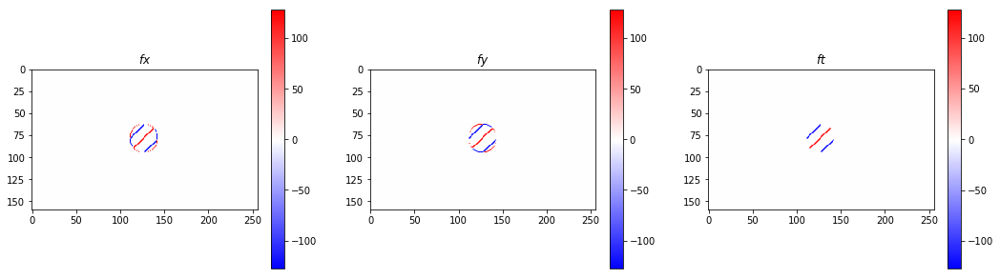

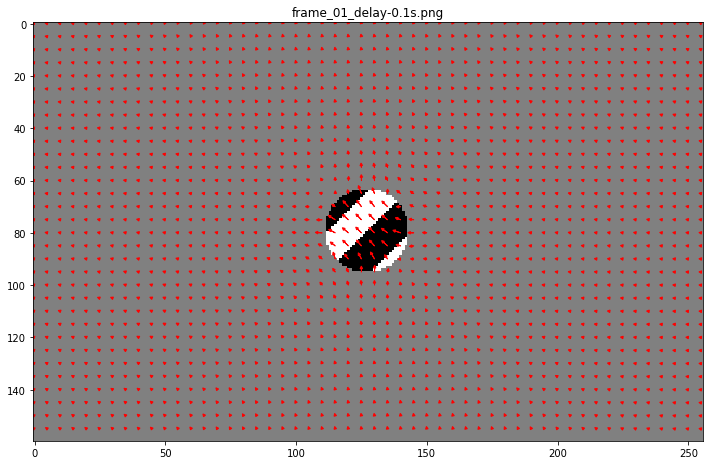

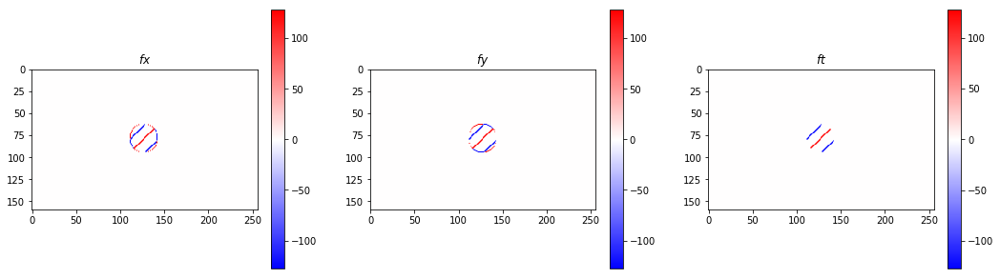

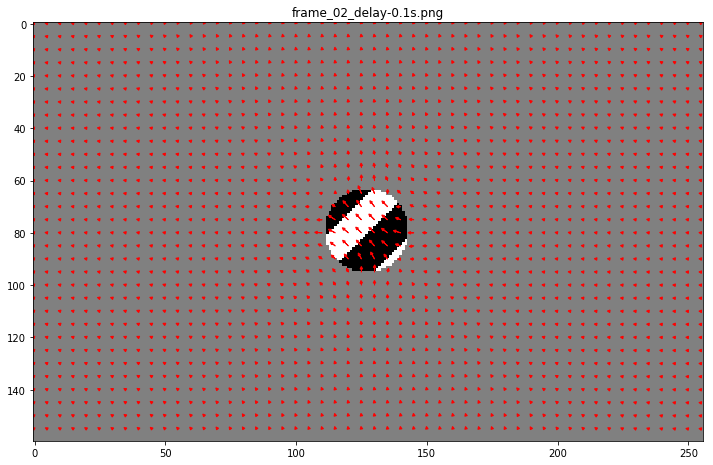

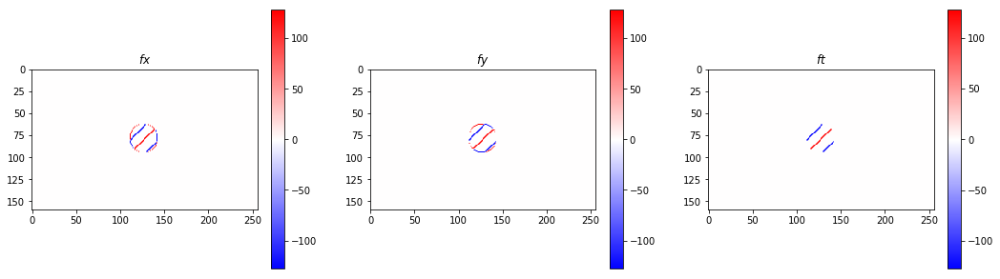

...

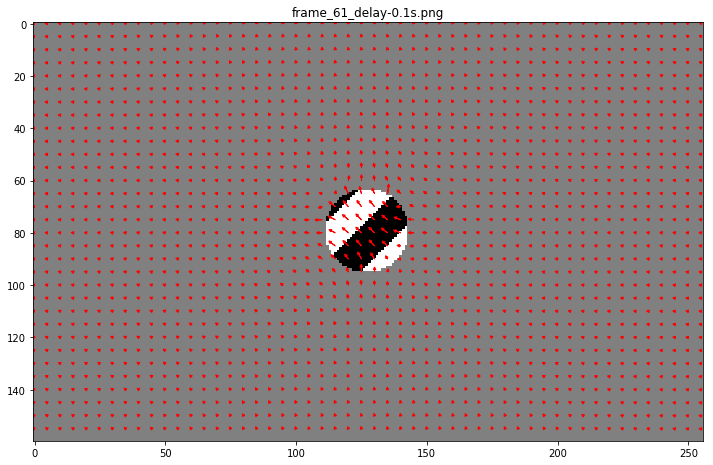

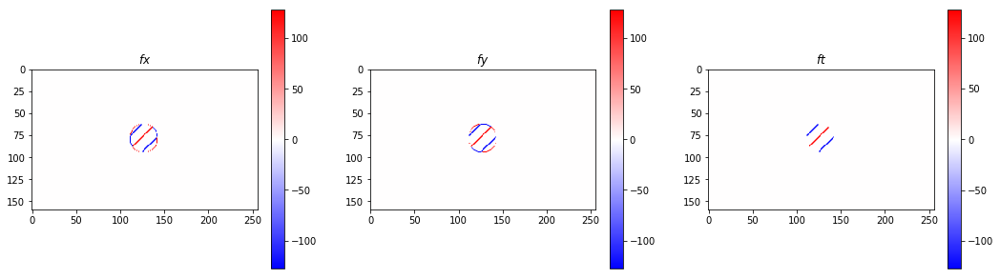

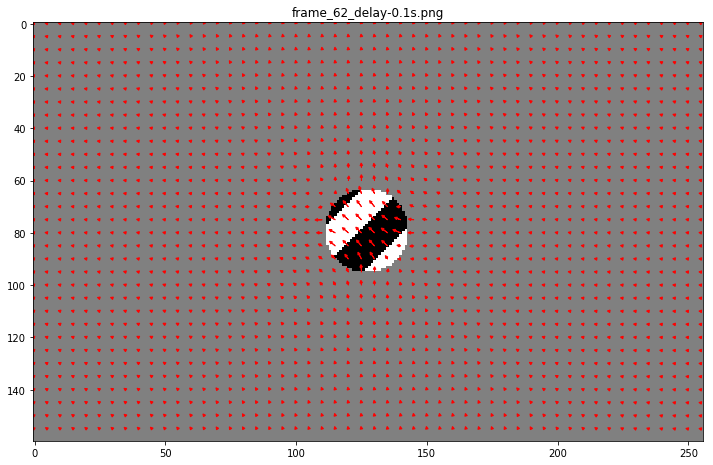

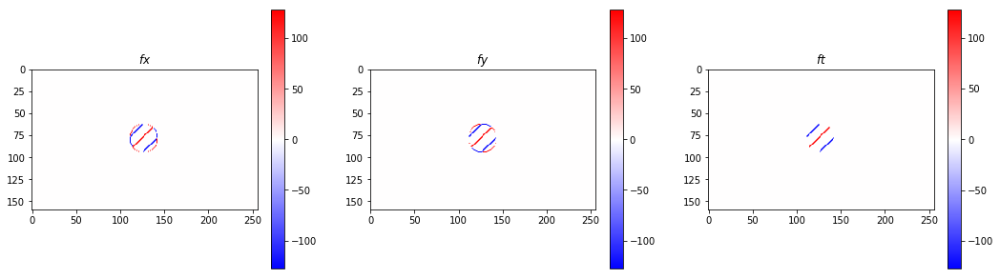

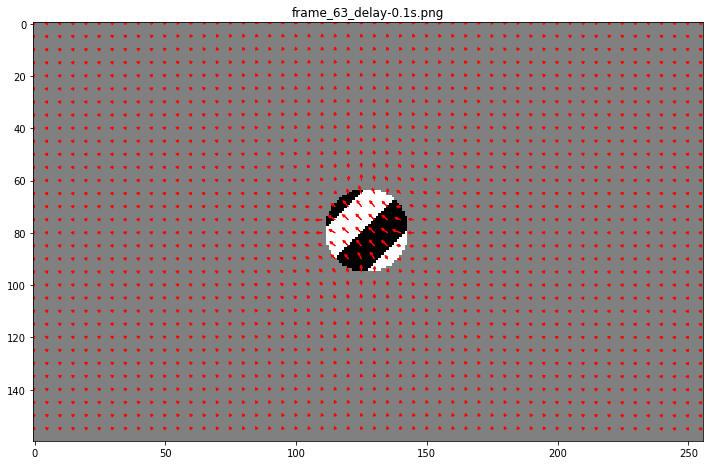

In [5]:
smooth_param, num_iterations = 10, 1000
U, V = Runner(Path, useCase, imageList, smooth_param, num_iterations)
plt.show()

In [0]:
anim_file = useCase[:-1] + '_smooth=' + str(smooth_param) + '_gif.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    frame = 2*(i**0.5)
    if round(frame) > round(last):
      last = frame
    else:
      continue
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

import IPython
if IPython.version_info > (6,2,0,''):
  display.Image(filename=anim_file)

In [0]:
try:
  from google.colab import files
except ImportError:
  pass
else:
  files.download(anim_file)